In [1]:
%matplotlib inline
%reload_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = 'retina'
# %qtconsole

In [2]:
import pandas as pd
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt

import logging
logging.basicConfig(level=logging.INFO)

np.random.seed(1234)

/Users/edeno/miniconda3/envs/replay_classification/lib/python3.6/site-packages/statsmodels/compat/pandas.py:56: FutureWarning: The pandas.core.datetools module is deprecated and will be removed in a future version. Please use the pandas.tseries module instead.
  from pandas.core import datetools



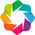

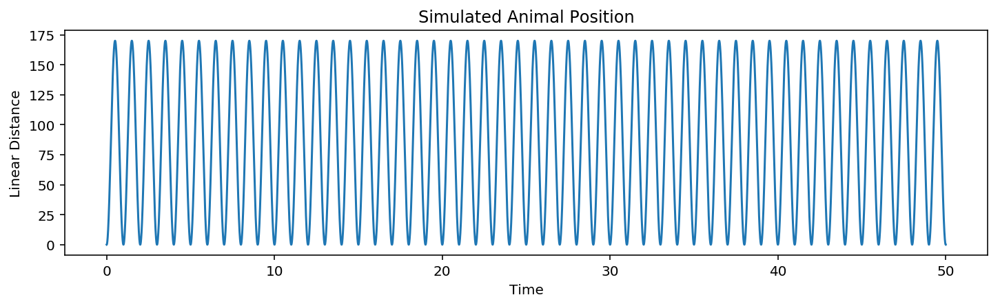

In [3]:
from replay_classification.simulate import simulate_time, simulate_linear_distance

SAMPLING_FREQUENCY = 1500
N_SAMPLES = SAMPLING_FREQUENCY * 50
TRACK_HEIGHT = 170

fig = plt.figure(figsize=(12, 3))
time = simulate_time(N_SAMPLES, SAMPLING_FREQUENCY)
linear_distance = simulate_linear_distance(time, TRACK_HEIGHT)
plt.plot(time, linear_distance);
plt.ylabel('Linear Distance')
plt.xlabel('Time')
plt.title('Simulated Animal Position');

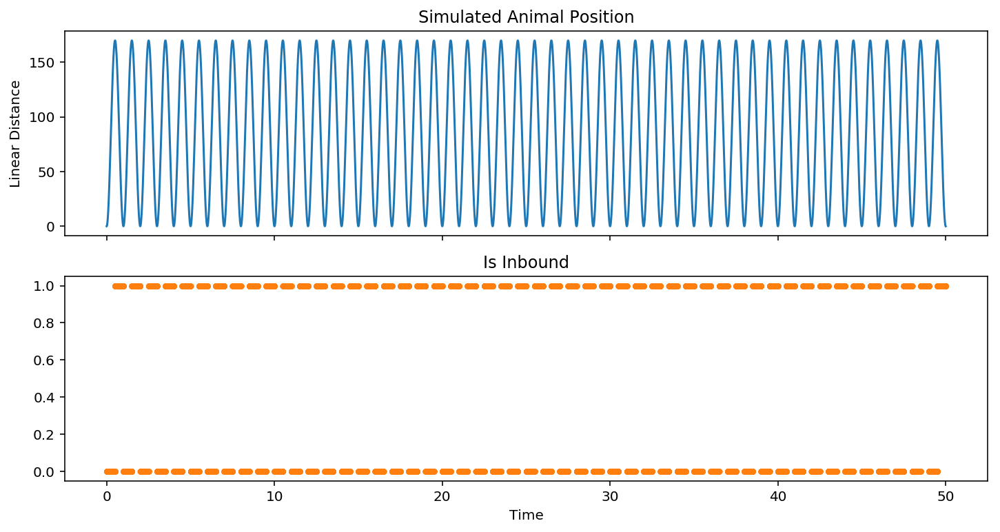

In [4]:
from replay_classification.simulate import get_trajectory_direction
trajectory_direction, is_inbound = get_trajectory_direction(linear_distance)

fig, axes = plt.subplots(2, 1, figsize=(12, 6), sharex=True)
axes[0].plot(time, linear_distance);
axes[0].set_ylabel('Linear Distance')
axes[1].set_xlabel('Time')
axes[0].set_title('Simulated Animal Position');

axes[1].plot(time, is_inbound, color='C1', linestyle='None', marker='.')
axes[1].set_title('Is Inbound');

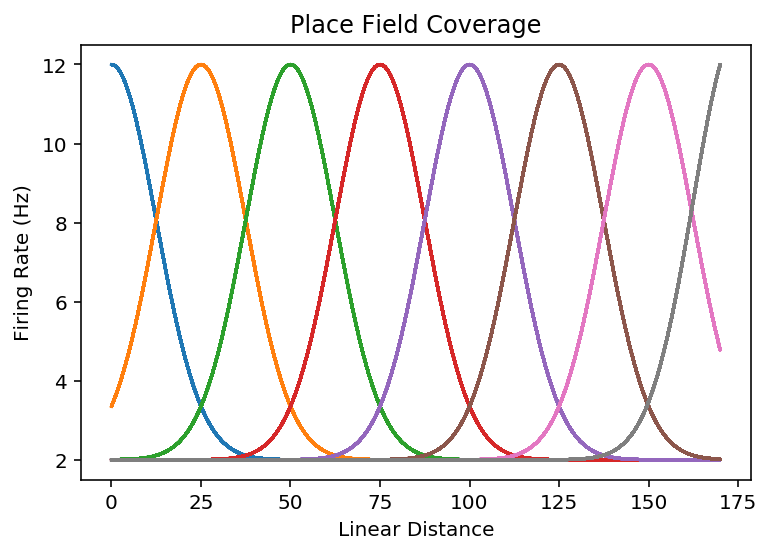

In [5]:
from replay_classification.simulate import create_place_field

place_field_support = np.arange(0, 176)
place_field_means = np.arange(0, 200, 25)

place_fields = np.stack([create_place_field(
    place_field_mean, linear_distance, SAMPLING_FREQUENCY, is_condition=None,
        place_field_std_deviation=12.5, max_firing_rate=10,
        baseline_firing_rate=2) for place_field_mean in place_field_means])
plt.plot(linear_distance, place_fields.T)
plt.xlabel('Linear Distance')
plt.ylabel('Firing Rate (Hz)')
plt.title('Place Field Coverage');

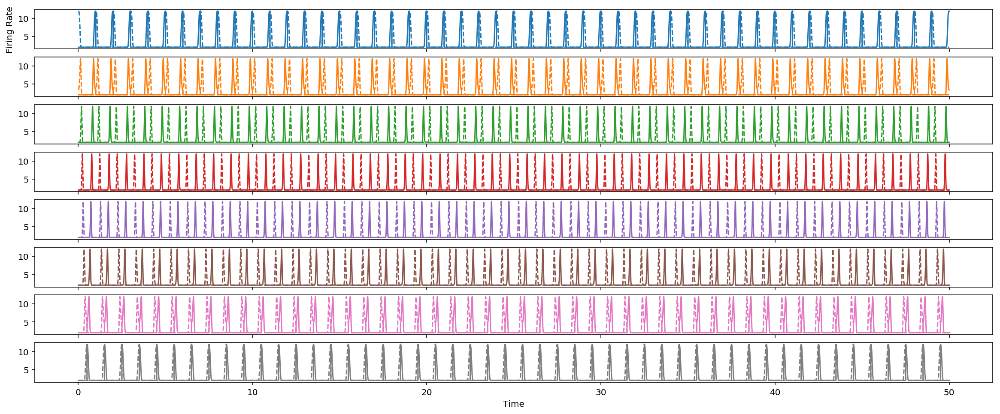

In [6]:
baseline_firing_rate = 2
n_neurons = len(place_field_means)
fig, axes = plt.subplots(n_neurons, 1, figsize=(20, n_neurons), sharex=True, sharey=True)

place_fields_inbound = place_fields = np.stack(
    [create_place_field(place_field_mean, linear_distance, SAMPLING_FREQUENCY,
                        is_condition=is_inbound)
     for place_field_mean in place_field_means])

colors = ['C{0}'.format(n) for n in range(n_neurons)]
for place_field, ax, color in zip(place_fields_inbound, axes, colors):
    ax.plot(time, place_field, color=color)

place_fields_outbound = place_fields = np.stack(
    [create_place_field(place_field_mean, linear_distance, SAMPLING_FREQUENCY,
                        is_condition=~is_inbound)
     for place_field_mean in place_field_means])
for place_field, ax, color in zip(place_fields_outbound, axes, colors):
    ax.plot(time, place_field, color=color, linestyle='--')
    
axes[-1].set_xlabel('Time')
axes[0].set_ylabel('Firing Rate');

In [7]:
from replay_classification.simulate import simulate_poisson_spikes

firing_rates = np.concatenate((place_fields_inbound, place_fields_outbound), axis=0)
spikes = simulate_poisson_spikes(firing_rates, SAMPLING_FREQUENCY)
spikes.shape

(16, 75000)

## Decode Simulated Data

In [8]:
from replay_classification import SortedSpikeDecoder

decoder = SortedSpikeDecoder(linear_distance, spikes, trajectory_direction, replay_speedup_factor=1)

In [9]:
decoder.fit();

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...


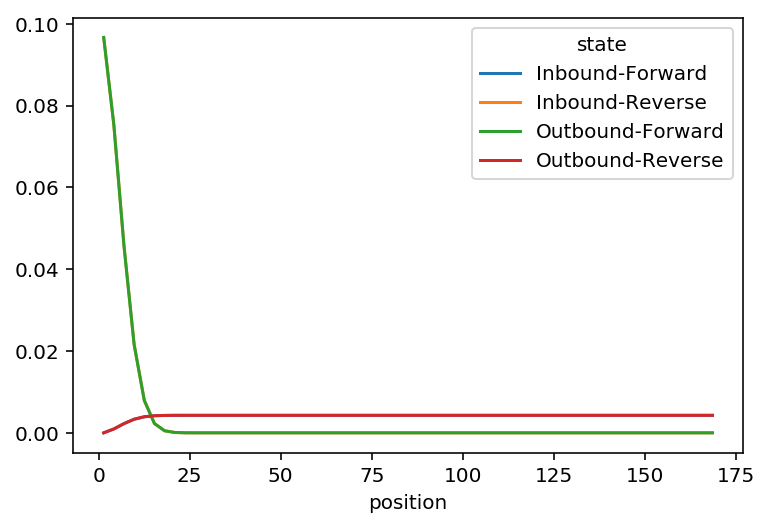

In [10]:
decoder.plot_initial_conditions();

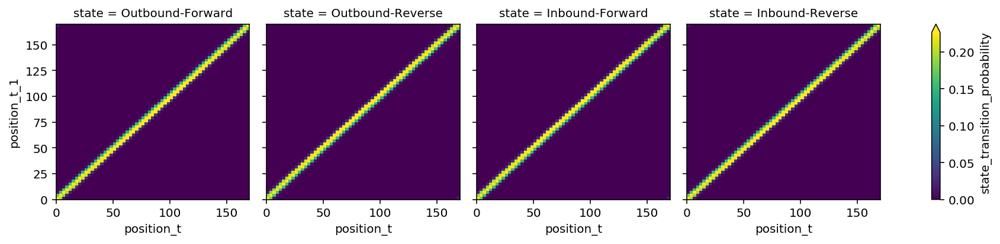

In [11]:
decoder.plot_state_transition_model();

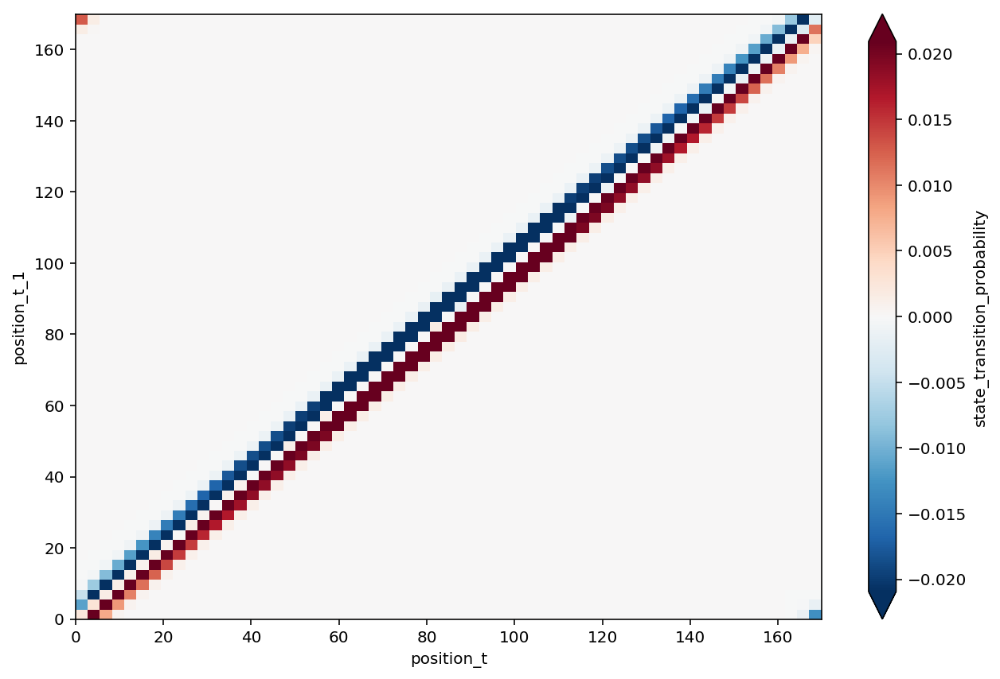

In [12]:
state_transition = decoder.state_transition_matrix

(state_transition.sel(state='Outbound-Forward') - state_transition.sel(state='Inbound-Forward')).plot(
    x='position_t', y='position_t_1', robust=True, size=7);

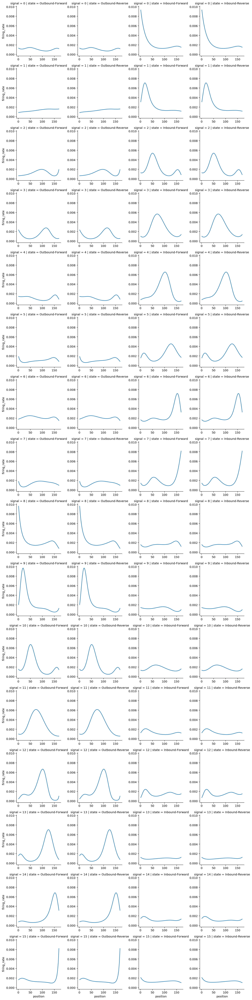

In [13]:
decoder.plot_observation_model();

### Outbound-Forward

In [14]:
outbound_time = time < 0.5
outbound_results = decoder.predict(spikes[:, outbound_time], time=time[outbound_time])

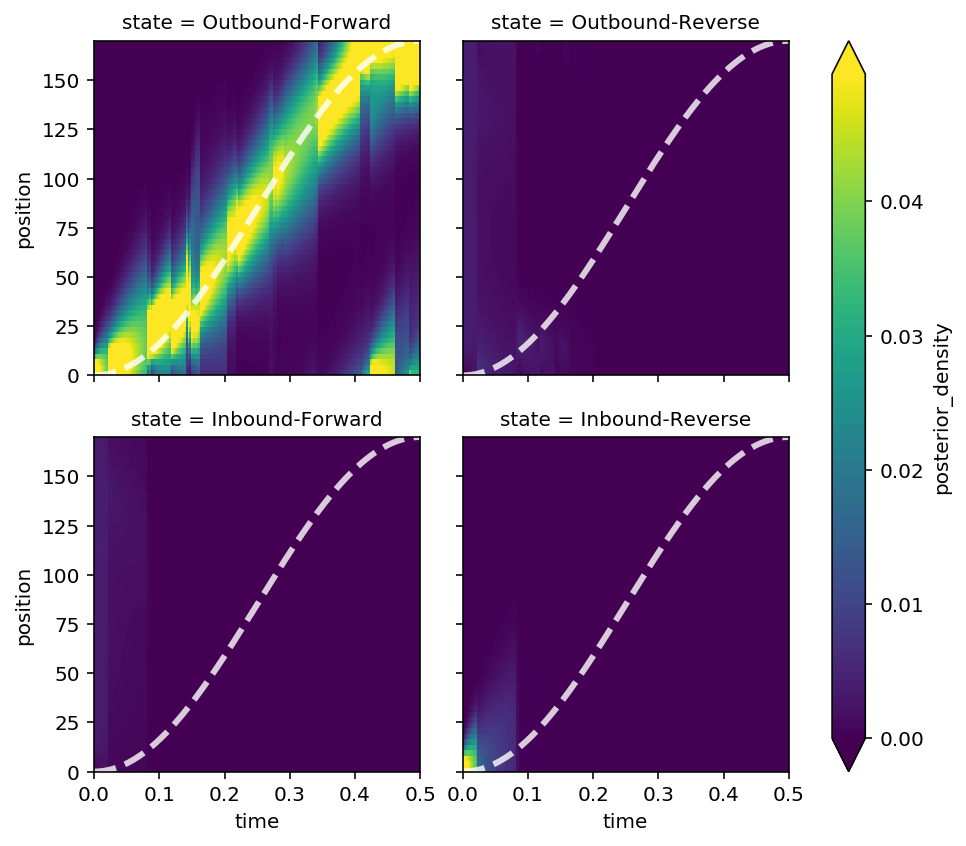

In [15]:
g = outbound_results.plot_posterior_density()

for ax in g.axes.ravel().tolist():
    ax.plot(time[outbound_time], linear_distance[outbound_time], color='white', linestyle='--', linewidth=3, alpha=0.8)

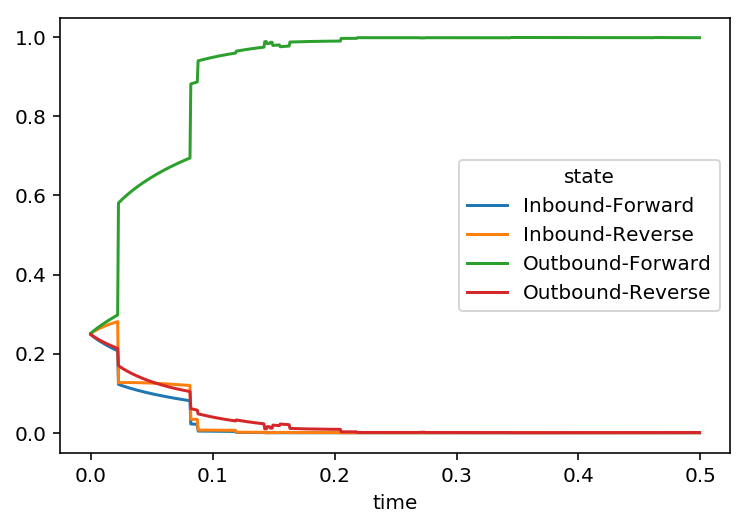

In [16]:
outbound_results.plot_state_probability();

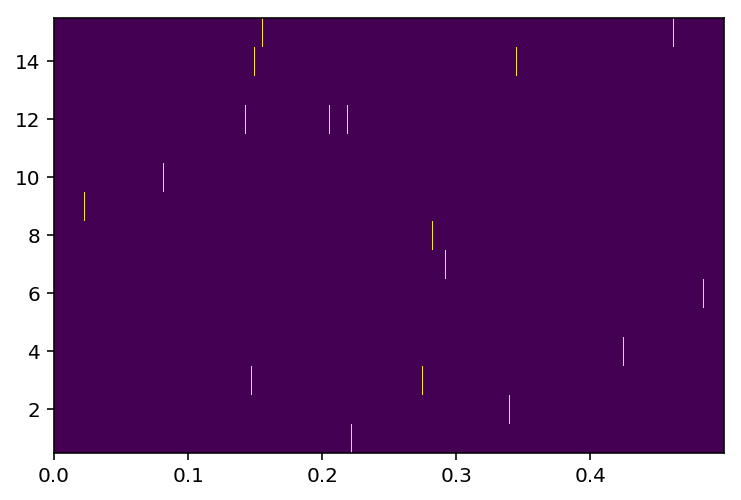

In [17]:
plt.pcolormesh(time[outbound_time], np.arange(n_neurons * 2) + 0.5, outbound_results.spikes);

### Inbound-Forward

In [18]:
inbound_time = (time > 1.5) & (time <= 2)
inbound_results = decoder.predict(spikes[:, inbound_time], time=time[inbound_time])

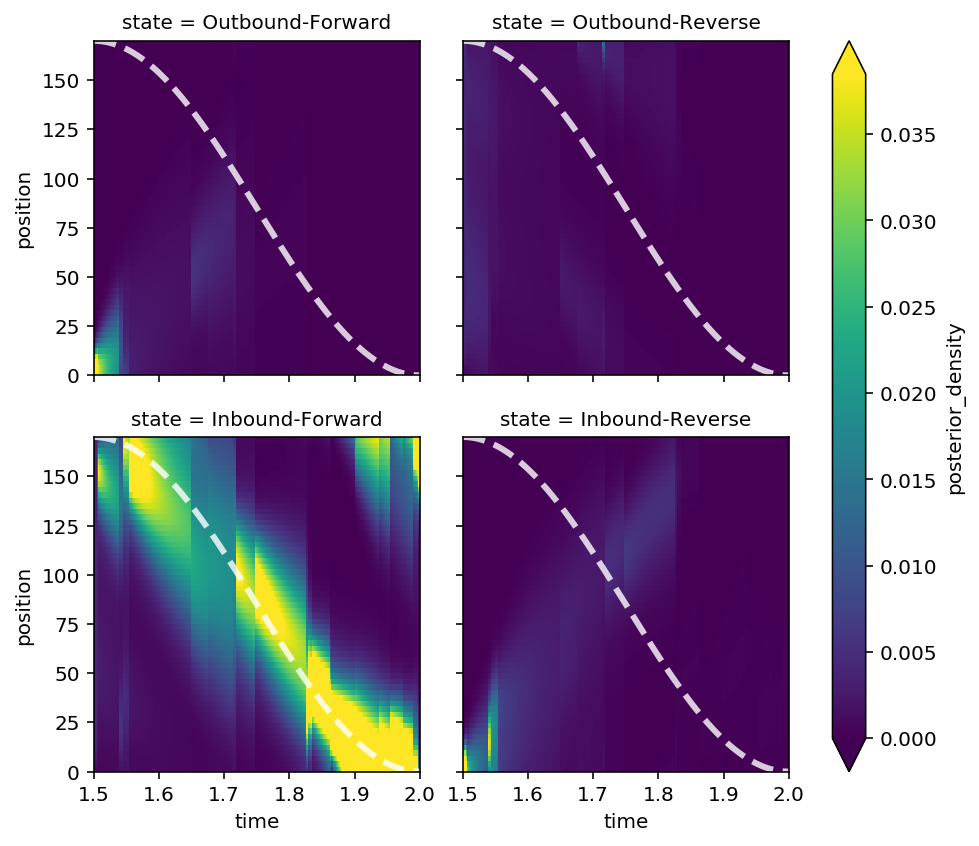

In [19]:
g = inbound_results.plot_posterior_density()

for ax in g.axes.ravel().tolist():
    ax.plot(time[inbound_time], linear_distance[inbound_time], color='white', linestyle='--', linewidth=3, alpha=0.8)

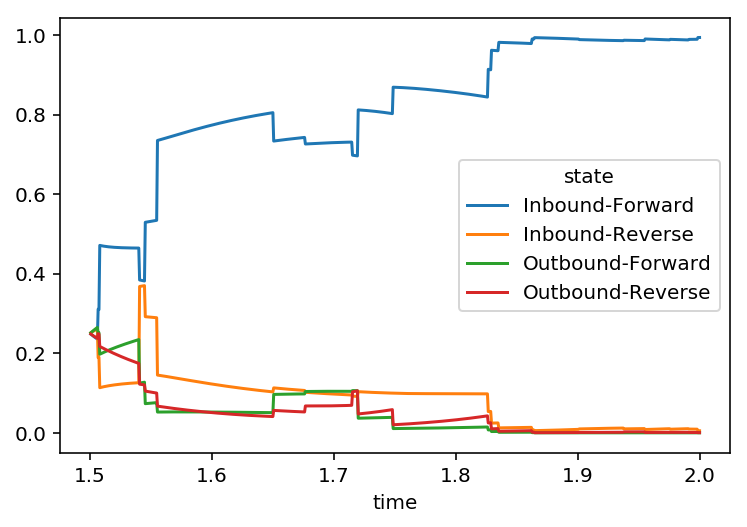

In [20]:
inbound_results.plot_state_probability();

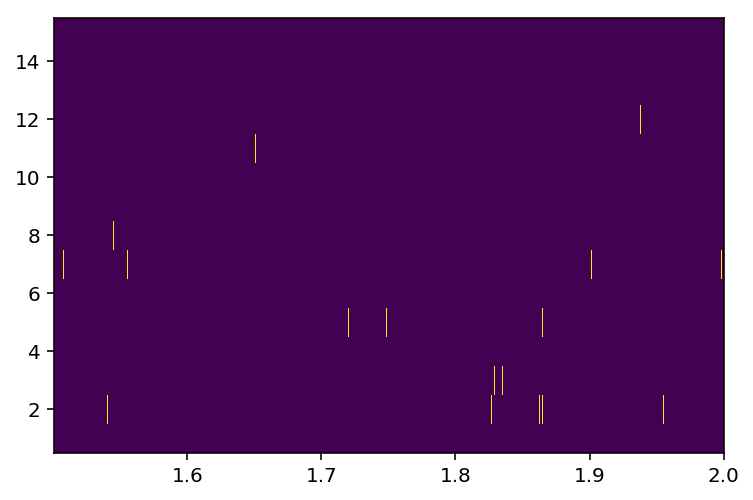

In [21]:
plt.pcolormesh(time[inbound_time], np.arange(n_neurons * 2) + 0.5, inbound_results.spikes);

## Decode Replay Simulation

In [22]:
decoder_spedup = SortedSpikeDecoder(
    linear_distance, spikes, trajectory_direction,
    replay_speedup_factor=9)

In [23]:
decoder_spedup.fit();

INFO:replay_classification.decoders:Fitting state transition model...
INFO:replay_classification.decoders:Fitting observation model...


In [50]:
n_replay_time_samples = n_neurons * 10
replay_time = simulate_time(n_replay_time_samples, SAMPLING_FREQUENCY)

### Inbound-Forward

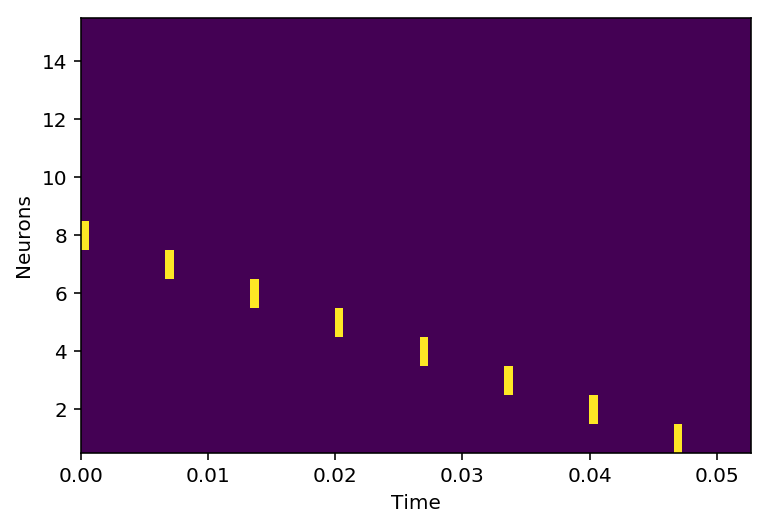

In [25]:
inbound_forward_replay_spikes = np.zeros((n_neurons * 2, replay_time.size))
inbound_forward_replay_spikes[:, ::10] = np.concatenate((np.fliplr(np.identity(n_neurons)), np.zeros((n_neurons, n_neurons))))
plt.pcolormesh(replay_time, np.arange(n_neurons * 2) + 0.5, inbound_forward_replay_spikes);
plt.xlabel('Time')
plt.ylabel('Neurons');

In [26]:
inbound_forward_results = decoder_spedup.predict(inbound_forward_replay_spikes, replay_time)

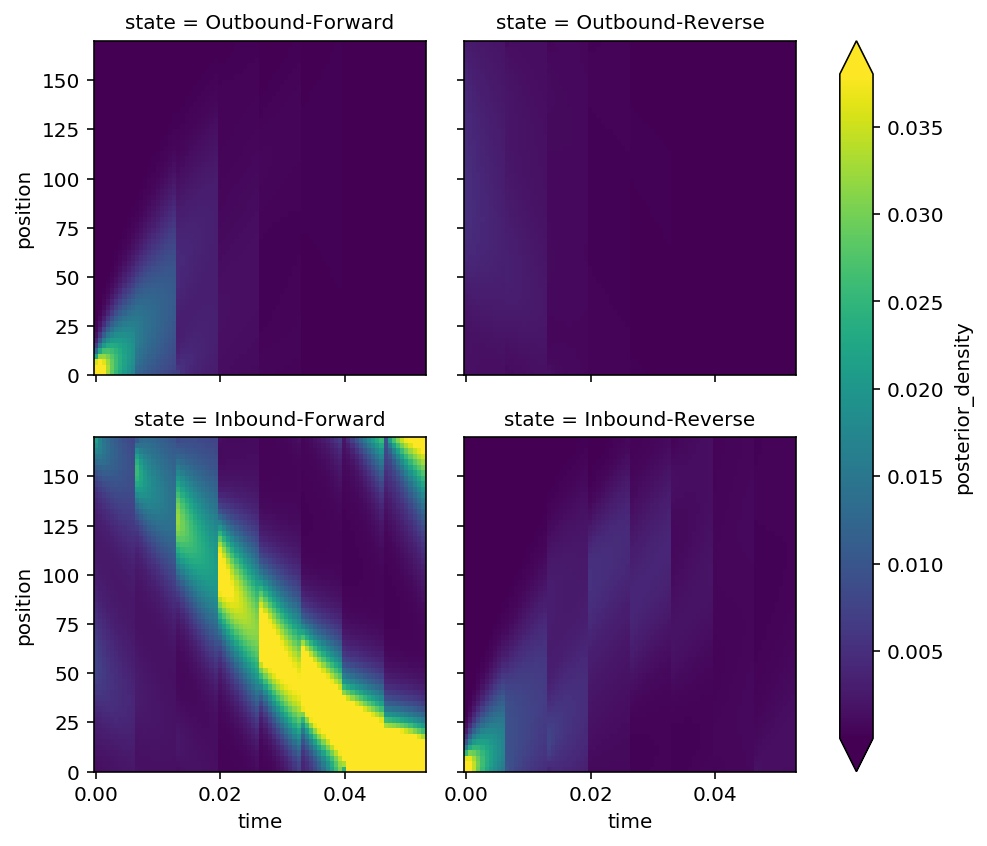

In [27]:
inbound_forward_results.plot_posterior_density();

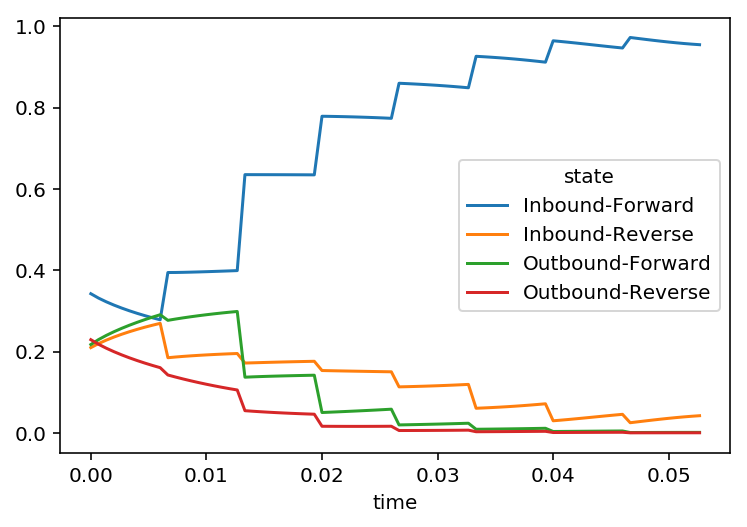

In [28]:
inbound_forward_results.plot_state_probability();

In [29]:
inbound_forward_results.plot_interactive()

:Layout
   .GridSpace.I   :GridSpace   [state]
      :HoloMap   [time]
         :Curve   [position]   (prior)
   .GridSpace.II  :GridSpace   [state]
      :HoloMap   [time]
         :Curve   [position]   (likelihood)
   .GridSpace.III :GridSpace   [state]
      :HoloMap   [time]
         :Curve   [position]   (posterior_density)

### Outbound-Forward

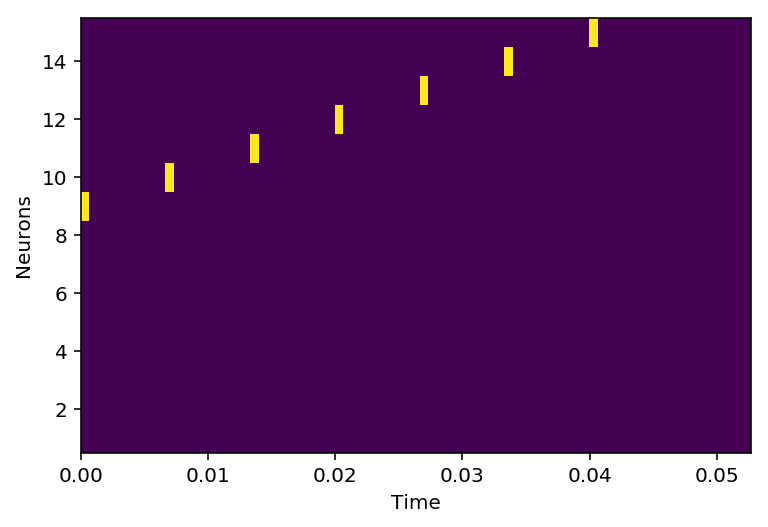

In [30]:
outbound_forward_replay_spikes = np.zeros((n_neurons * 2, replay_time.size))
outbound_forward_replay_spikes[:, ::10] = np.concatenate((np.zeros((n_neurons, n_neurons)), np.identity(n_neurons)))
plt.pcolormesh(replay_time, np.arange(n_neurons * 2) + 0.5, outbound_forward_replay_spikes);
plt.xlabel('Time')
plt.ylabel('Neurons');

In [31]:
outbound_forward_results = decoder_spedup.predict(outbound_forward_replay_spikes, replay_time)

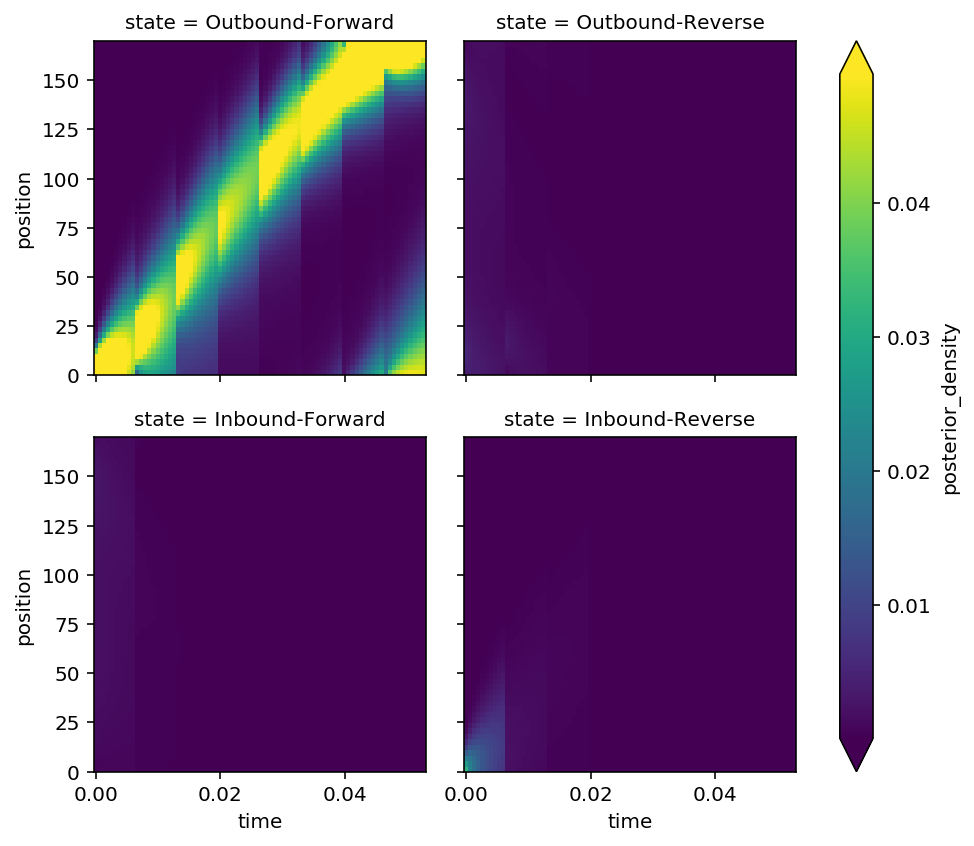

In [32]:
outbound_forward_results.plot_posterior_density();

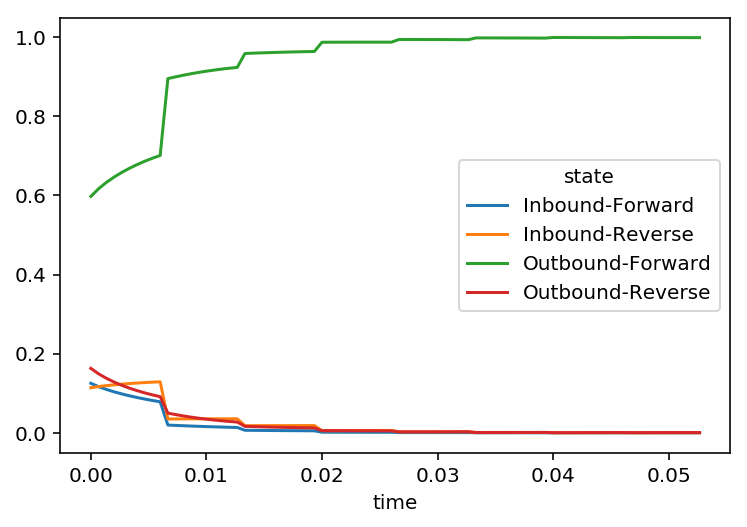

In [33]:
outbound_forward_results.plot_state_probability();

In [34]:
outbound_forward_results.plot_interactive()

:Layout
   .GridSpace.I   :GridSpace   [state]
      :HoloMap   [time]
         :Curve   [position]   (prior)
   .GridSpace.II  :GridSpace   [state]
      :HoloMap   [time]
         :Curve   [position]   (likelihood)
   .GridSpace.III :GridSpace   [state]
      :HoloMap   [time]
         :Curve   [position]   (posterior_density)

### Inbound Reverse

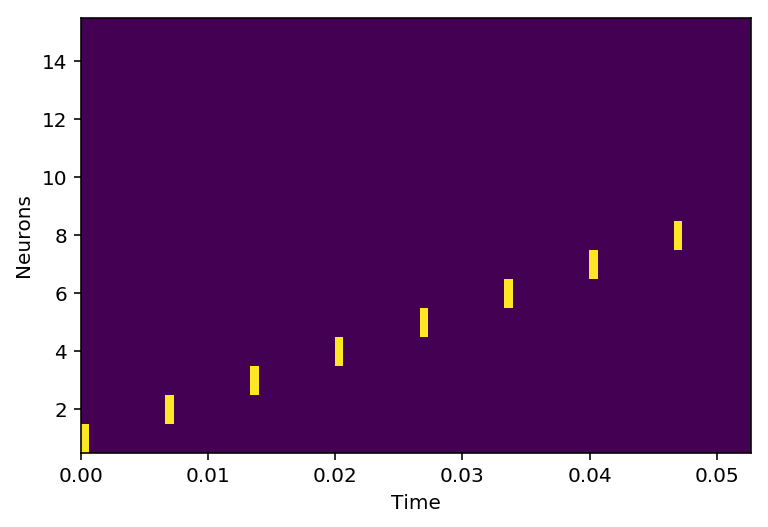

In [35]:
inbound_reverse_replay_spikes = np.zeros((n_neurons * 2, replay_time.size))
inbound_reverse_replay_spikes[:, ::10] = np.concatenate((np.identity(n_neurons), np.zeros((n_neurons, n_neurons))))
plt.pcolormesh(replay_time, np.arange(n_neurons * 2) + 0.5, inbound_reverse_replay_spikes);
plt.xlabel('Time')
plt.ylabel('Neurons');

In [36]:
inbound_reverse_results = decoder_spedup.predict(inbound_reverse_replay_spikes, replay_time)

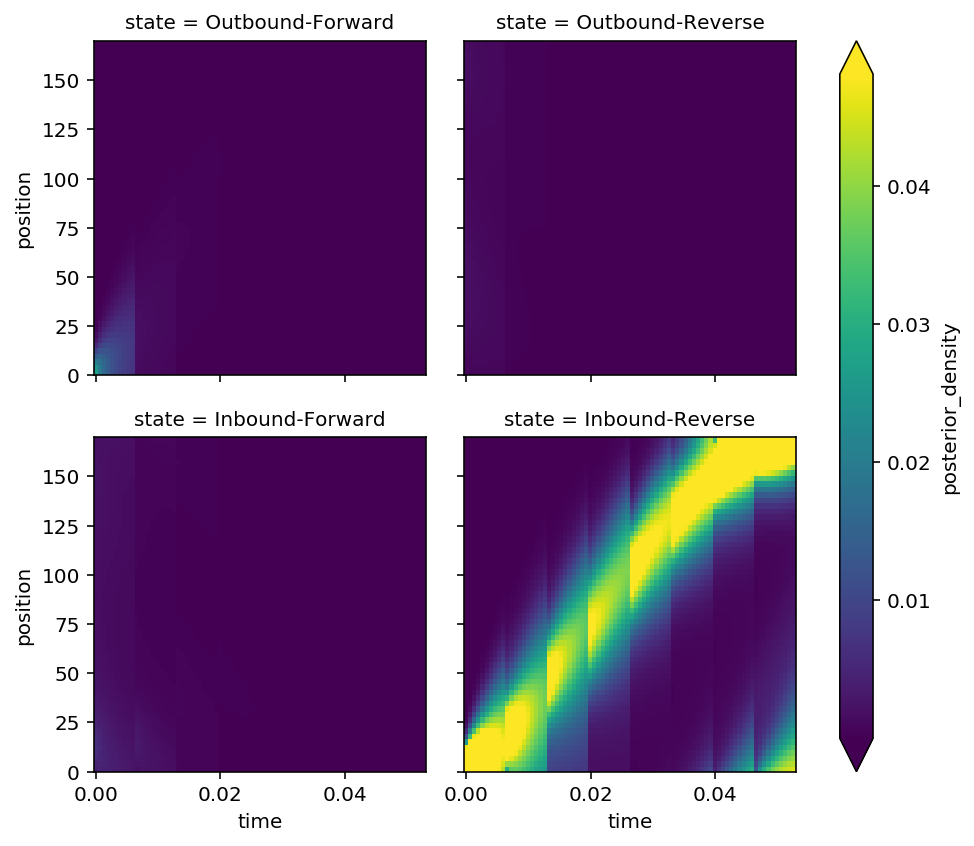

In [37]:
inbound_reverse_results.plot_posterior_density();

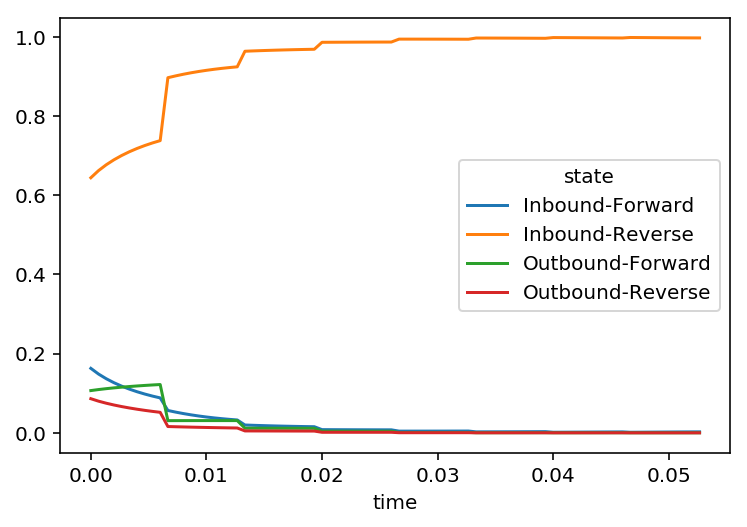

In [38]:
inbound_reverse_results.plot_state_probability();

In [39]:
inbound_reverse_results.plot_interactive()

:Layout
   .GridSpace.I   :GridSpace   [state]
      :HoloMap   [time]
         :Curve   [position]   (prior)
   .GridSpace.II  :GridSpace   [state]
      :HoloMap   [time]
         :Curve   [position]   (likelihood)
   .GridSpace.III :GridSpace   [state]
      :HoloMap   [time]
         :Curve   [position]   (posterior_density)

### Outbound-Reverse
fix spike plot

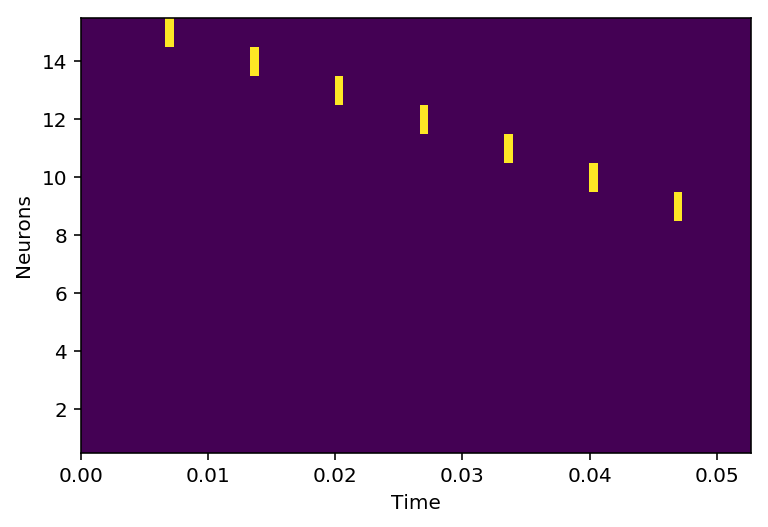

In [40]:
outbound_reverse_replay_spikes = np.zeros((n_neurons * 2, replay_time.size))
outbound_reverse_replay_spikes[:, ::10] = np.concatenate((np.zeros((n_neurons, n_neurons)), np.fliplr(np.identity(n_neurons))))
plt.pcolormesh(replay_time, np.arange(n_neurons * 2) + 0.5, outbound_reverse_replay_spikes);
plt.xlabel('Time')
plt.ylabel('Neurons');

In [41]:
outbound_reverse_results = decoder_spedup.predict(outbound_reverse_replay_spikes, replay_time)

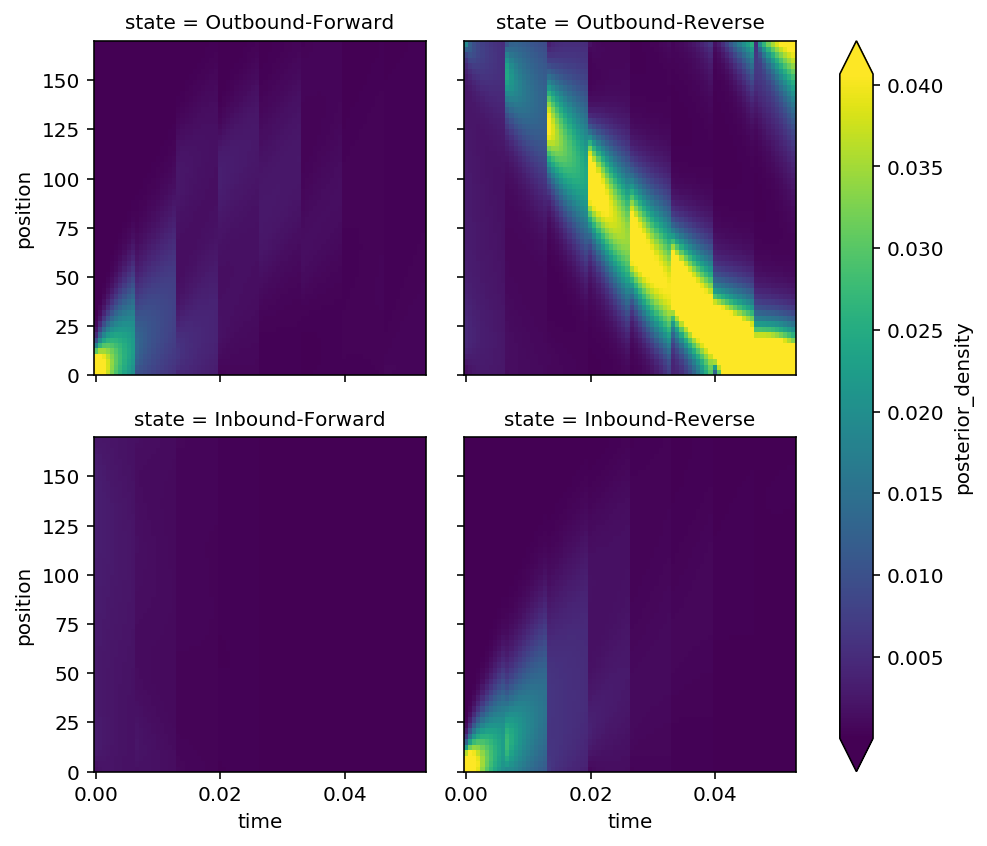

In [42]:
outbound_reverse_results.plot_posterior_density();

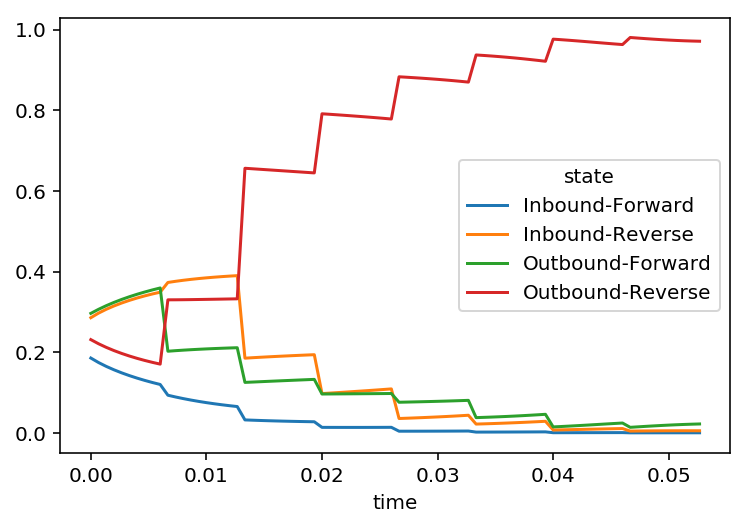

In [43]:
outbound_reverse_results.plot_state_probability();

In [44]:
outbound_reverse_results.plot_interactive()

:Layout
   .GridSpace.I   :GridSpace   [state]
      :HoloMap   [time]
         :Curve   [position]   (prior)
   .GridSpace.II  :GridSpace   [state]
      :HoloMap   [time]
         :Curve   [position]   (likelihood)
   .GridSpace.III :GridSpace   [state]
      :HoloMap   [time]
         :Curve   [position]   (posterior_density)

### No state

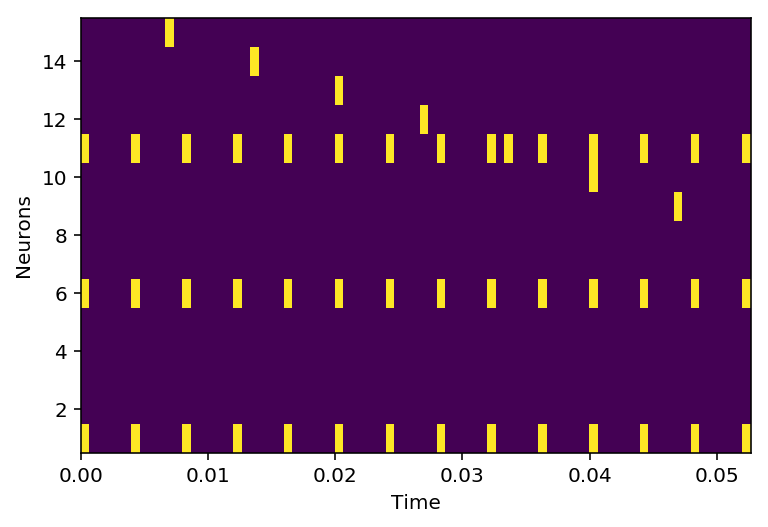

In [45]:
no_state_replay_spikes = np.zeros((n_neurons * 2, replay_time.size))
no_state_replay_spikes[:, ::10] = np.concatenate((np.zeros((n_neurons, n_neurons)), np.fliplr(np.identity(n_neurons))))
no_state_replay_spikes[::5, ::6] = 1

plt.pcolormesh(replay_time, np.arange(n_neurons * 2) + 0.5, no_state_replay_spikes);
plt.xlabel('Time')
plt.ylabel('Neurons');

In [46]:
no_state_results = decoder_spedup.predict(no_state_replay_spikes, replay_time)

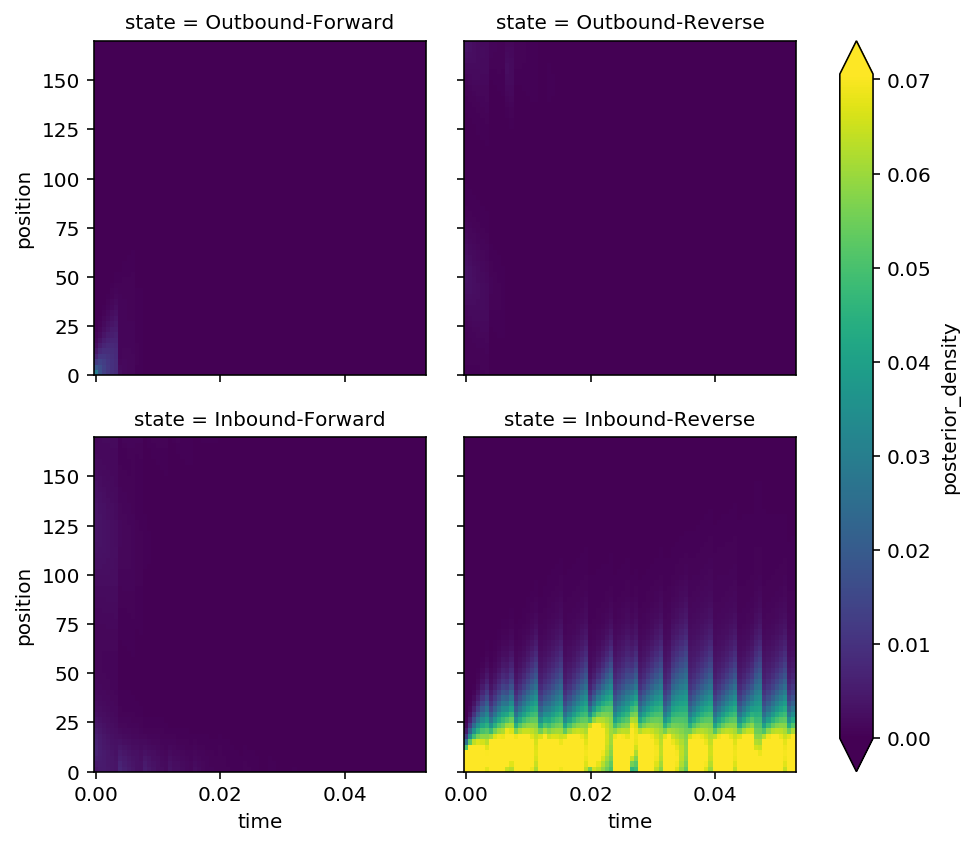

In [47]:
no_state_results.plot_posterior_density();

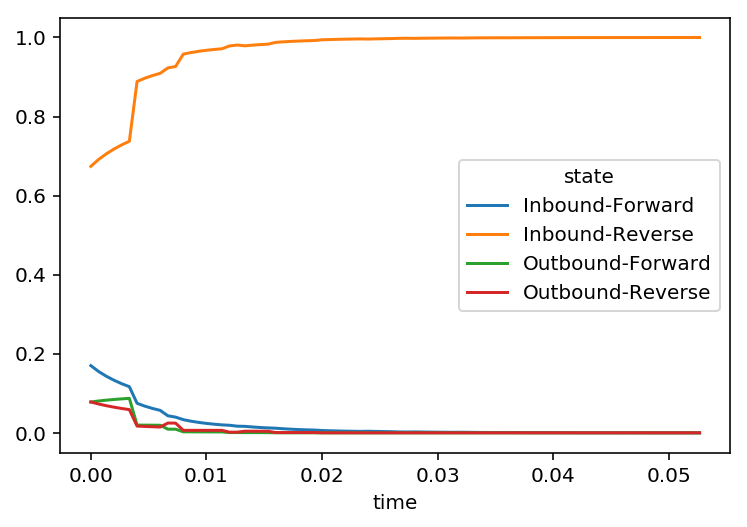

In [48]:
no_state_results.plot_state_probability();

In [49]:
no_state_results.plot_interactive()

:Layout
   .GridSpace.I   :GridSpace   [state]
      :HoloMap   [time]
         :Curve   [position]   (prior)
   .GridSpace.II  :GridSpace   [state]
      :HoloMap   [time]
         :Curve   [position]   (likelihood)
   .GridSpace.III :GridSpace   [state]
      :HoloMap   [time]
         :Curve   [position]   (posterior_density)